In [2]:
#import libraries
import os #for changing path, etc
import imageio #for reading image files
import matplotlib.pyplot as plt #for displaying figure/image data
import pandas as pd #for data handling/analysis
import plotly #for interactive plots
import plotly.express as px #for displaying data on overlay
import plotly.graph_objects as go #for intearctive plots
import scipy.stats as ss # for statistical testing
import scikit_posthocs as sp # for posthoc testing
#import functions
from skimage import measure, morphology
from skimage.color import rgb2gray
from skimage.filters import (gaussian, threshold_yen)
from skimage.measure import regionprops_table

In [3]:
#Define Path and change directory
path = 'C:/Users/Yunus/Documents/AAA Uni/Experimental Design and Practise/6) Image analysis microscope'
os.chdir(path)

In [4]:
imagename = 'fish1'  #change here the file name
#read image - change image name here!
image = imageio.imread(imagename+'.jpg')

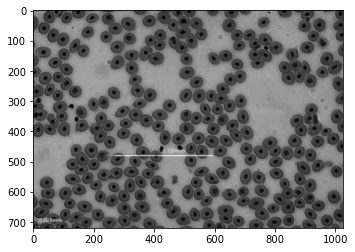

In [5]:
#image processing - convert to greyscale and perform gaussian filtering
img = rgb2gray(image)
img= gaussian(img, sigma=1)
#Show image
plt.imshow(img, cmap='gray')
# Binary image, post-process the binary mask and compute labels; change parameters here as needed
block_size = 51 # this is the size of the window for adaptive thresholding
threshold = threshold_yen(img, block_size) #change here the algorithm

In [15]:
mask = img < threshold*0.5 #change here the factor
#especially change here the parameters below for erosion and removing objects; comment out if not needed
#mask = morphology.erosion(mask)

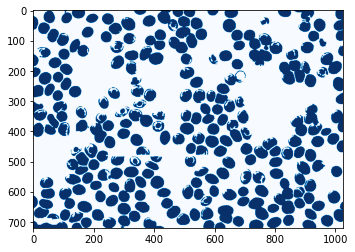

In [17]:
mask = morphology.remove_small_objects(mask, 400) #start with low value, then look at interactive picture to see what is nuclear size, then iterate

mask = morphology.remove_small_holes(mask, 5000)
plt.imshow(mask, cmap='Blues')

In [7]:
#Measure objects area and shape data and save to array props1
labels = measure.label(mask)
props1 = regionprops_table(labels, properties=('area','perimeter','eccentricity','solidity'))
dataframe = pd.DataFrame(props1)

In [8]:
#convert array to csv and save to "shapedata" in path specified above
dataframe.to_csv(imagename+'nuclear_shapedata.csv', encoding='utf-8', index=False)

In [9]:
#generate interactive image to display data on cells when hovering over the cells
fig = px.imshow(img, binary_string=True, width=1400, height=1000)
fig.update_traces(hoverinfo='skip') # hover is only for label info
props = measure.regionprops(labels, img)
properties = ['area','perimeter','eccentricity','solidity']
for index in range(1, labels.max()):
    label_i = props[index].label
    contour = measure.find_contours(labels == label_i, 0.5)[0]
    y, x = contour.T
    hoverinfo = ''
    for prop_name in properties:
        hoverinfo += f'<b>{prop_name}: {getattr(props[index], prop_name):.2f}</b><br>'
    fig.add_trace(go.Scatter(
        x=x, y=y, name=label_i,
        mode='lines', fill='toself', showlegend=False,
        hovertemplate=hoverinfo, hoveron='points+fills'))


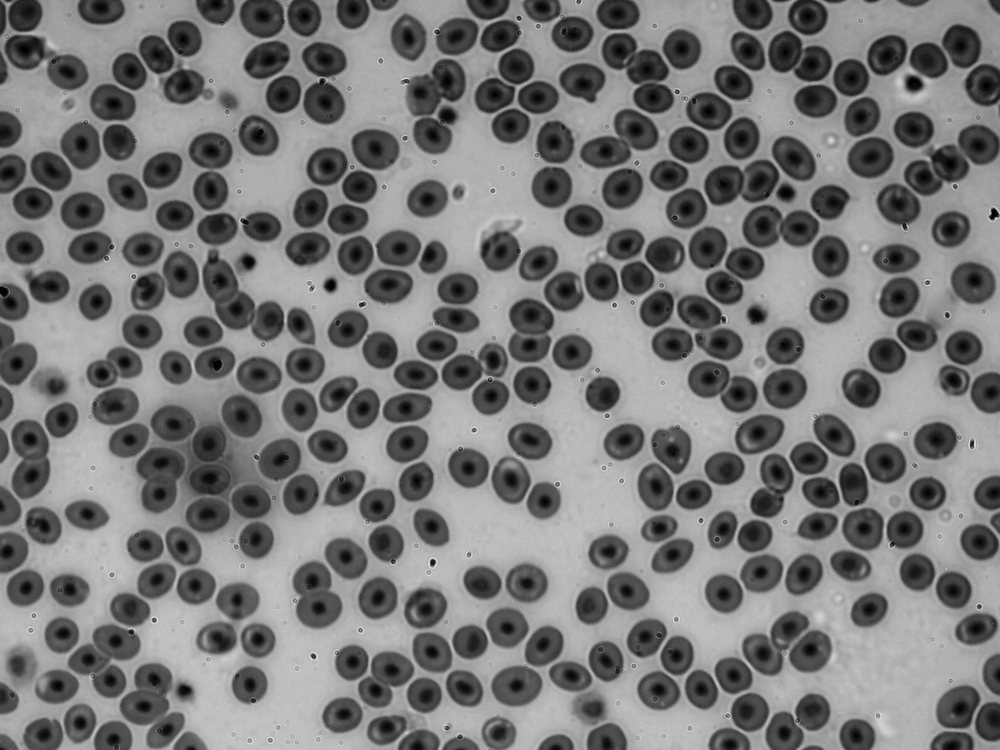

In [10]:
#show interactive figure and save to html (in specified folder)
plotly.io.show(fig)
fig.write_html(imagename+"nuclei.html")